# WORKING DOC

### Import Libraries and Dependencies

In [4]:
# Import libraries and dependencies
import os
os.environ['KRAKEN_PUBLIC_KEY'] = 'OjlIbB2geI0hoXmVR70NHpBZW2S9mrtnsazfU91r7PbqKslAsd2hZbrA'
os.environ['KRAKEN_SECRET_KEY'] = 'NX0cfwu7MKnYdTy5yW2Ae9gLXNILk/BLt+2s8hl84w/ySUTSpVZxN6amIggnClMRuYrOreT9elt8V2DnWjkdhg=='
print(os.getenv('KRAKEN_API_KEY'))
!pip install ccxt
import ccxt
import warnings
import numpy as np
import pandas as pd
from pathlib import Path
from datetime import datetime
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
!pip install hvplot holoviews
import hvplot.pandas
warnings.filterwarnings('ignore')
%matplotlib inline

None


### Import Environment Variables

In [5]:
# Load environment variables

# Import environment variables
kraken_public_key = os.getenv("KRAKEN_PUBLIC_KEY")
kraken_secret_key = os.getenv("KRAKEN_SECRET_KEY")

# Verify that environment variables were loaded
print(f"Kraken key data type: {type(kraken_public_key)}")
print(f"Kraken secret data type: {type(kraken_secret_key)}")

Kraken key data type: <class 'str'>
Kraken secret data type: <class 'str'>


### Set Public and Private Keys for Kraken Exchange via the CCXT library

In [6]:
# Set the public and private keys for the API
exchange = ccxt.kraken({
    'apiKey': kraken_public_key,
    'secret': kraken_secret_key,
})

### Connect to Kraken and Load Available Cyptocurrency Data

In [7]:
# Connect to Kraken and load the available cryptocurrencies
crypto_details = exchange.load_markets()
crypto_details['LINK/USDT']['symbol']
# crypto_details

'LINK/USDT'

### Fetch Historical Data for LINK/USDT
Note: Other options include ADA, BCH, DAI, DOT, EOS, ETH, LINK, LTC, USDC, BTC, DOGE and XRP

In [8]:
# Fetch daily candlestick bar data from `LINK/USD`
historical_prices = exchange.fetch_ohlcv("LINK/USDT", "1h")
historical_prices[2]

[1620568800000, 48.86427, 49.91365, 48.75978, 49.91365, 1307.73267974]

In [9]:
# Import the data as a Pandas DataFrame and set the columns
historical_prices_df = pd.DataFrame(
    historical_prices, 
    columns=["timestamp", "open", "high", "low", "close", "volume"]
)

display(historical_prices_df.head())
display()
display("____________________________________")
display()
display(f"historical_prices_df shape: {historical_prices_df.shape}")

,timestamp,open,high,low,close,volume
0,1620561600000,48.41414,49.06728,47.61288,47.69708,1777.427578
1,1620565200000,48.15448,48.81072,48.15448,48.81072,834.732460
2,1620568800000,48.86427,49.91365,48.75978,49.91365,1307.732680
3,1620572400000,49.86212,51.80152,49.79133,51.80152,2582.096918
4,1620576000000,51.86890,52.31117,50.75032,50.89869,4851.980910


'____________________________________'

'historical_prices_df shape: (720, 6)'

### Convert Epoch Timestamp to Readable Date Format

In [10]:
# Convert epoch timestamp to date using the `to_datetime` function and `unit` parameter
historical_prices_df["date"] = pd.to_datetime(
    historical_prices_df["timestamp"], 
    unit="ms"
)

# UNIT ARGUEMENTS COULD INCLUDE: (ms,us,ns) 

display(historical_prices_df.head())
display("_________________________")
display(f"historical_prices_df shape: {historical_prices_df.shape}")

,timestamp,open,high,low,close,volume,date
0,1620561600000,48.41414,49.06728,47.61288,47.69708,1777.427578,2021-05-09 12:00:00
1,1620565200000,48.15448,48.81072,48.15448,48.81072,834.732460,2021-05-09 13:00:00
2,1620568800000,48.86427,49.91365,48.75978,49.91365,1307.732680,2021-05-09 14:00:00
3,1620572400000,49.86212,51.80152,49.79133,51.80152,2582.096918,2021-05-09 15:00:00
4,1620576000000,51.86890,52.31117,50.75032,50.89869,4851.980910,2021-05-09 16:00:00


'_________________________'

'historical_prices_df shape: (720, 7)'

In [11]:
# historical_prices_df = historical_prices_df.set_index('date')
historical_prices_df.set_index(pd.to_datetime(
    historical_prices_df['date'], 
    infer_datetime_format=True), 
    inplace=True
)
historical_prices_df
historical_prices_df.to_csv("sreeni2.csv")

### Plot Daily Returns

In [12]:
# Drop NAs and calculate daily percent return
historical_prices_df['daily_return'] = historical_prices_df['close'].pct_change()
historical_prices_df = historical_prices_df.dropna() 
historical_prices_df

,timestamp,open,high,low,close,volume,date,daily_return
date,,,,,,,,
2021-05-09 13:00:00,1620565200000,48.15448,48.81072,48.15448,48.81072,834.732460,2021-05-09 13:00:00,0.023348
2021-05-09 14:00:00,1620568800000,48.86427,49.91365,48.75978,49.91365,1307.732680,2021-05-09 14:00:00,0.022596
2021-05-09 15:00:00,1620572400000,49.86212,51.80152,49.79133,51.80152,2582.096918,2021-05-09 15:00:00,0.037823
2021-05-09 16:00:00,1620576000000,51.86890,52.31117,50.75032,50.89869,4851.980910,2021-05-09 16:00:00,-0.017429
2021-05-09 17:00:00,1620579600000,50.78164,51.04909,50.38189,50.59835,762.838726,2021-05-09 17:00:00,-0.005901
...,...,...,...,...,...,...,...,...
2021-06-08 07:00:00,1623135600000,23.43900,24.15363,23.15568,24.08114,3226.119101,2021-06-08 07:00:00,0.023567
2021-06-08 08:00:00,1623139200000,24.08000,24.55486,24.08000,24.20431,1343.862639,2021-06-08 08:00:00,0.005115
2021-06-08 09:00:00,1623142800000,24.20431,24.20431,23.70598,23.71481,928.390683,2021-06-08 09:00:00,-0.020224


### Construct Exponential Moving Average of Closing Prices (Trading Signal, Feature One)
#### 9, 20, 50, 200

In [13]:
# Set short and long windows


# Construct EMAS for short and long windows, respectively 9, 20, 50 and 200
historical_prices_df['EMA_9'] = historical_prices_df['close'].ewm(halflife=9).mean()
historical_prices_df['EMA_20'] = historical_prices_df['close'].ewm(halflife=20).mean()
historical_prices_df['EMA_50'] = historical_prices_df['close'].ewm(halflife=50).mean()
historical_prices_df['EMA_200'] = historical_prices_df['close'].ewm(halflife=200).mean()

# Construct a 9 VS 20 crossover trading signal
historical_prices_df['crossover_long_9v20'] = np.where(historical_prices_df['EMA_9'] > historical_prices_df['EMA_20'], 1.0, 0.0)
historical_prices_df['crossover_short_9v20'] = np.where(historical_prices_df['EMA_9'] < historical_prices_df['EMA_20'], -1.0, 0.0)
historical_prices_df['crossover_signal_9v20'] = historical_prices_df['crossover_long_9v20'] + historical_prices_df['crossover_short_9v20']


# Construct a 50 VS 200 crossover trading signal
historical_prices_df['crossover_long_50v200'] = np.where(historical_prices_df['EMA_50'] > historical_prices_df['EMA_200'], 1.0, 0.0)
historical_prices_df['crossover_short_50v200'] = np.where(historical_prices_df['EMA_50'] < historical_prices_df['EMA_200'], -1.0, 0.0)
historical_prices_df['crossover_signal_50v200'] = historical_prices_df['crossover_long_50v200'] + historical_prices_df['crossover_short_50v200']


historical_prices_df.head()

,timestamp,open,high,low,close,volume,date,daily_return,EMA_9,EMA_20,EMA_50,EMA_200,crossover_long_9v20,crossover_short_9v20,crossover_signal_9v20,crossover_long_50v200,crossover_short_50v200,crossover_signal_50v200
date,,,,,,,,,,,,,,,,,,
2021-05-09 13:00:00,1620565200000,48.15448,48.81072,48.15448,48.81072,834.732460,2021-05-09 13:00:00,0.023348,48.810720,48.810720,48.810720,48.810720,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-09 14:00:00,1620568800000,48.86427,49.91365,48.75978,49.91365,1307.732680,2021-05-09 14:00:00,0.022596,49.383410,49.371740,49.366007,49.363141,1.0,0.0,1.0,1.0,0.0,1.0
2021-05-09 15:00:00,1620572400000,49.86212,51.80152,49.79133,51.80152,2582.096918,2021-05-09 15:00:00,0.037823,50.252259,50.209893,50.189125,50.178752,1.0,0.0,1.0,1.0,0.0,1.0
2021-05-09 16:00:00,1620576000000,51.86890,52.31117,50.75032,50.89869,4851.980910,2021-05-09 16:00:00,-0.017429,50.432987,50.391145,50.370222,50.359673,1.0,0.0,1.0,1.0,0.0,1.0
2021-05-09 17:00:00,1620579600000,50.78164,51.04909,50.38189,50.59835,762.838726,2021-05-09 17:00:00,-0.005901,50.471339,50.435507,50.417121,50.407740,1.0,0.0,1.0,1.0,0.0,1.0


In [14]:
for col in historical_prices_df.columns:
    print(col)

timestamp
open
high
low
close
volume
date
daily_return
EMA_9
EMA_20
EMA_50
EMA_200
crossover_long_9v20
crossover_short_9v20
crossover_signal_9v20
crossover_long_50v200
crossover_short_50v200
crossover_signal_50v200


### Plot Exponential Moving Average of Closing Prices 9 VS 20

<AxesSubplot:xlabel='date'>

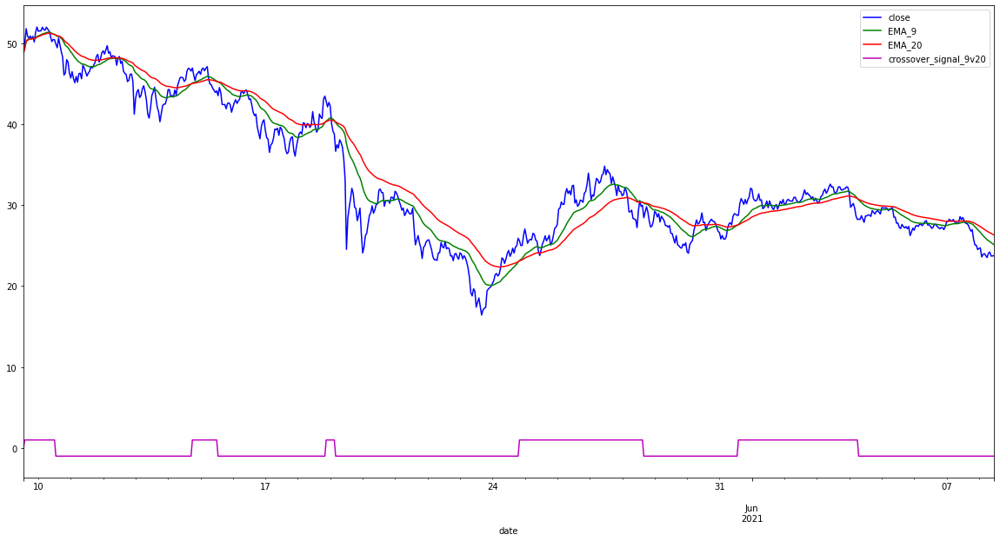

In [15]:
# Plot the EMA of LINK/USD closing prices
historical_prices_df[['close', 'EMA_9', 'EMA_20', 'crossover_signal_9v20']].plot(figsize=(20,10), color=['b', 'g', 'r', 'm'])

In [16]:
### Plot Exponential Moving Average of Closing Prices 50 VS 200

<AxesSubplot:xlabel='date'>

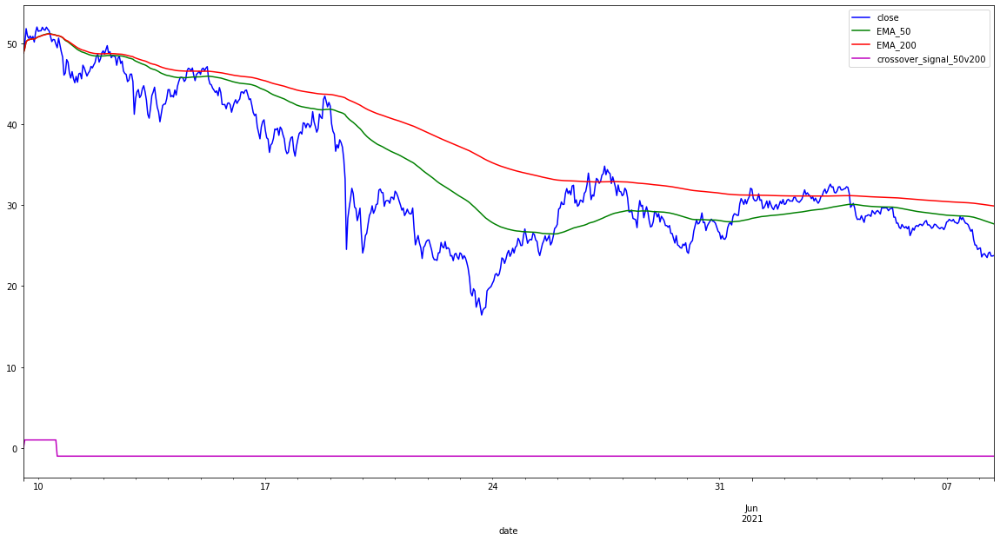

In [17]:
# Plot the EMA of LINK/USD closing prices
historical_prices_df[['close', 'EMA_50', 'EMA_200', 'crossover_signal_50v200']].plot(figsize=(20,10), color=['b', 'g', 'r', 'm'])

<AxesSubplot:xlabel='date'>

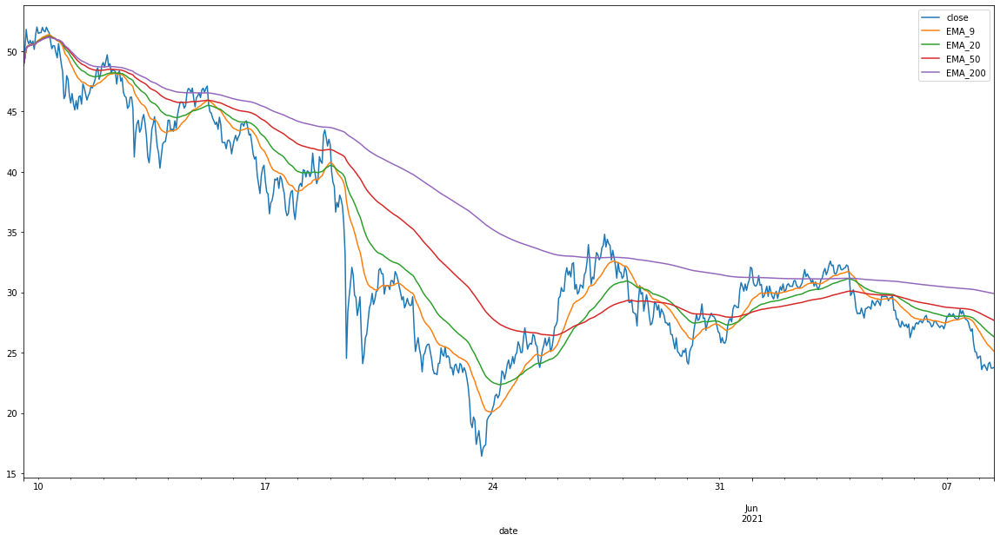

In [18]:
# Plot the EMA of LINK/USD closing prices
historical_prices_df[['close', 'EMA_9', 'EMA_20', 'EMA_50', 'EMA_200']].plot(figsize=(20,10))

### Construct Bollinger Band (Trading Signal, Feature Three)

In [19]:
# Set bollinger band window
bollinger_window = 20

# Calculate rolling mean and standard deviation
historical_prices_df['bollinger_mid_band'] = historical_prices_df['close'].rolling(window=bollinger_window).mean()
historical_prices_df['bollinger_std'] = historical_prices_df['close'].rolling(window=20).std()

# Calculate upper and lowers bands of bollinger band
historical_prices_df['bollinger_upper_band']  = historical_prices_df['bollinger_mid_band'] + (historical_prices_df['bollinger_std'] * 1)
historical_prices_df['bollinger_lower_band']  = historical_prices_df['bollinger_mid_band'] - (historical_prices_df['bollinger_std'] * 1)

# Calculate bollinger band trading signal
historical_prices_df['bollinger_long'] = np.where(historical_prices_df['close'] < historical_prices_df['bollinger_lower_band'], 1.0, 0.0)
historical_prices_df['bollinger_short'] = np.where(historical_prices_df['close'] > historical_prices_df['bollinger_upper_band'], -1.0, 0.0)
historical_prices_df['bollinger_signal'] = historical_prices_df['bollinger_long'] + historical_prices_df['bollinger_short']

historical_prices_df.iloc[50:60]

,timestamp,open,high,low,close,volume,date,daily_return,EMA_9,EMA_20,...,crossover_long_50v200,crossover_short_50v200,crossover_signal_50v200,bollinger_mid_band,bollinger_std,bollinger_upper_band,bollinger_lower_band,bollinger_long,bollinger_short,bollinger_signal
date,,,,,,,,,,,,,,,,,,,,,
2021-05-11 15:00:00,1620745200000,46.56857,47.39065,46.55429,47.13410,1389.492589,2021-05-11 15:00:00,0.012454,47.105294,47.950537,...,0.0,-1.0,-1.0,46.353986,0.760653,47.114639,45.593332,0.0,-1.0,-1.0
2021-05-11 16:00:00,1620748800000,47.48667,47.74007,46.74607,46.94687,1265.477368,2021-05-11 16:00:00,-0.003972,47.093333,47.909596,...,0.0,-1.0,-1.0,46.385098,0.772030,47.157128,45.613068,0.0,0.0,0.0
2021-05-11 17:00:00,1620752400000,46.92590,47.31392,46.89973,47.30236,240.835894,2021-05-11 17:00:00,0.007572,47.109093,47.884991,...,0.0,-1.0,-1.0,46.351459,0.711378,47.062837,45.640082,0.0,-1.0,-1.0
2021-05-11 18:00:00,1620756000000,47.28713,47.68971,47.28713,47.62206,475.986052,2021-05-11 18:00:00,0.006759,47.147721,47.874406,...,0.0,-1.0,-1.0,46.350115,0.708817,47.058932,45.641298,0.0,-1.0,-1.0
2021-05-11 19:00:00,1620759600000,47.66501,48.38680,47.66501,48.38680,2348.696724,2021-05-11 19:00:00,0.016059,47.240916,47.894907,...,0.0,-1.0,-1.0,46.452499,0.842438,47.294936,45.610061,0.0,-1.0,-1.0
2021-05-11 20:00:00,1620763200000,48.32021,48.64818,48.00315,48.61872,753.104233,2021-05-11 20:00:00,0.004793,47.344433,47.923697,...,0.0,-1.0,-1.0,46.598261,0.951200,47.549462,45.647061,0.0,-1.0,-1.0
2021-05-11 21:00:00,1620766800000,48.65911,48.65911,47.58793,47.66812,624.742964,2021-05-11 21:00:00,-0.019552,47.368727,47.913589,...,0.0,-1.0,-1.0,46.657219,0.980171,47.637390,45.677048,0.0,-1.0,-1.0
2021-05-11 22:00:00,1620770400000,47.82394,48.07519,47.68153,48.07519,77.056121,2021-05-11 22:00:00,0.008540,47.421702,47.919945,...,0.0,-1.0,-1.0,46.778797,0.998464,47.777260,45.780333,0.0,-1.0,-1.0
2021-05-11 23:00:00,1620774000000,48.13309,48.80319,48.13309,48.80319,322.137117,2021-05-11 23:00:00,0.015143,47.525206,47.954504,...,0.0,-1.0,-1.0,46.962913,1.016007,47.978920,45.946905,0.0,-1.0,-1.0


### Plot Bollinger Bands

<AxesSubplot:xlabel='date'>

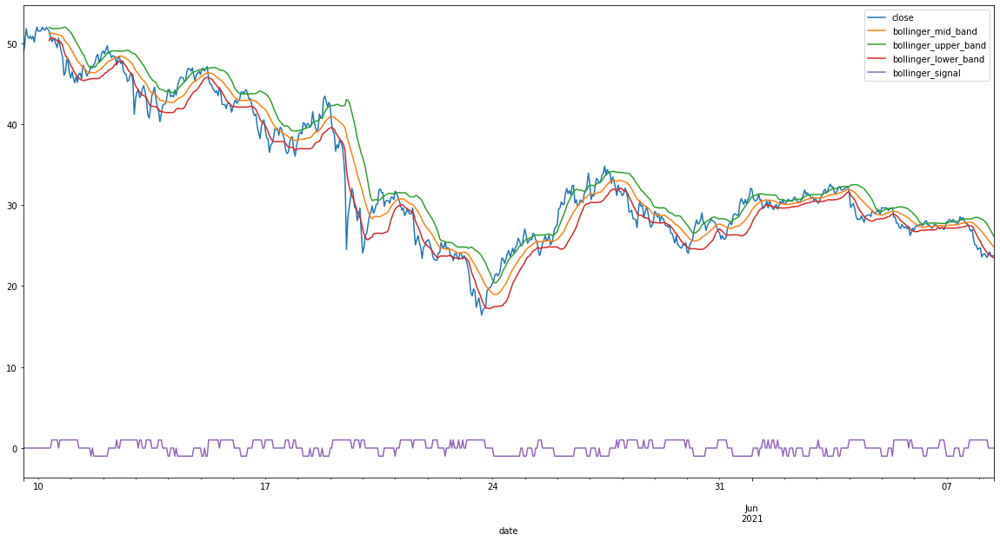

In [20]:
# Plot the Bollinger Bands for LINK/USD closing prices
historical_prices_df[['close','bollinger_mid_band','bollinger_upper_band','bollinger_lower_band', 'bollinger_signal']].plot(figsize=(20,10))

### Build MACD Signals

In [21]:

# Construct a `Fast` and `Slow` Exponential Moving Average from short and long windows, respectively
historical_prices_df['mac_fast_12'] = historical_prices_df['close'].ewm(span=12, adjust=False).mean()
historical_prices_df['mac_slow_26'] = historical_prices_df['close'].ewm(span=26, adjust=False).mean()

# Build the Macd line and the Signal Line
macd = historical_prices_df['mac_fast_12'] - historical_prices_df['mac_slow_26']
historical_prices_df['macd'] = macd

historical_prices_df['mac_signal_line_9ema'] = macd.ewm(span=9, adjust=False).mean()

# Calculate difference between macd and signal
macd_diff = historical_prices_df['macd'] - historical_prices_df['mac_signal_line_9ema']
historical_prices_df['macd_diff'] = macd_diff


# Construct a macd trading signal
historical_prices_df['macd_long'] = np.where(historical_prices_df['macd_diff'] > 0, 1.0, 0.0)
historical_prices_df['macd_short'] = np.where(historical_prices_df['macd_diff'] < 0, -1.0, 0.0)
historical_prices_df['macd_signal'] = historical_prices_df['macd_long'] + historical_prices_df['macd_short']

# Construct a conservative SELL signals
historical_prices_df['macd_diff_shift'] = historical_prices_df['macd_diff'].shift(1)
historical_prices_df['macd_diff_gradient'] = ( (historical_prices_df['macd_diff'] - historical_prices_df['macd_diff_shift']) / (historical_prices_df['macd_diff_shift']) )

historical_prices_df['macd_conservative_long_exit'] = np.where(historical_prices_df['macd_diff_gradient'] < 0, -1.0, 0.0)
historical_prices_df['macd_conservative_short_exit'] = np.where(historical_prices_df['macd_diff_gradient'] > 0, 1.0, 0.0)


mac_list = ['close', 'mac_fast_12', 'mac_slow_26', 'macd', 'mac_signal_line_9ema', 'macd_diff', 'macd_long', 'macd_short', 'macd_signal', 'macd_diff_shift', 'macd_diff_gradient', 'macd_conservative_long_exit', 'macd_conservative_short_exit']
historical_prices_df[mac_list].iloc[50:100]

,close,mac_fast_12,mac_slow_26,macd,mac_signal_line_9ema,macd_diff,macd_long,macd_short,macd_signal,macd_diff_shift,macd_diff_gradient,macd_conservative_long_exit,macd_conservative_short_exit
date,,,,,,,,,,,,,
2021-05-11 15:00:00,47.13410,46.554647,47.139730,-0.585083,-0.815379,0.230296,1.0,0.0,1.0,0.182064,0.264915,0.0,1.0
2021-05-11 16:00:00,46.94687,46.614989,47.125444,-0.510455,-0.754394,0.243939,1.0,0.0,1.0,0.230296,0.059242,0.0,1.0
2021-05-11 17:00:00,47.30236,46.720739,47.138549,-0.417811,-0.687077,0.269267,1.0,0.0,1.0,0.243939,0.103829,0.0,1.0
2021-05-11 18:00:00,47.62206,46.859403,47.174365,-0.314961,-0.612654,0.297693,1.0,0.0,1.0,0.269267,0.105568,0.0,1.0
2021-05-11 19:00:00,48.38680,47.094387,47.264175,-0.169787,-0.524081,0.354293,1.0,0.0,1.0,0.297693,0.190131,0.0,1.0
2021-05-11 20:00:00,48.61872,47.328900,47.364511,-0.035611,-0.426387,0.390776,1.0,0.0,1.0,0.354293,0.102971,0.0,1.0
2021-05-11 21:00:00,47.66812,47.381088,47.387001,-0.005913,-0.342292,0.336379,1.0,0.0,1.0,0.390776,-0.139202,-1.0,0.0
2021-05-11 22:00:00,48.07519,47.487873,47.437978,0.049895,-0.263855,0.313750,1.0,0.0,1.0,0.336379,-0.067274,-1.0,0.0
2021-05-11 23:00:00,48.80319,47.690229,47.539105,0.151125,-0.180859,0.331983,1.0,0.0,1.0,0.313750,0.058116,0.0,1.0


<AxesSubplot:xlabel='date'>

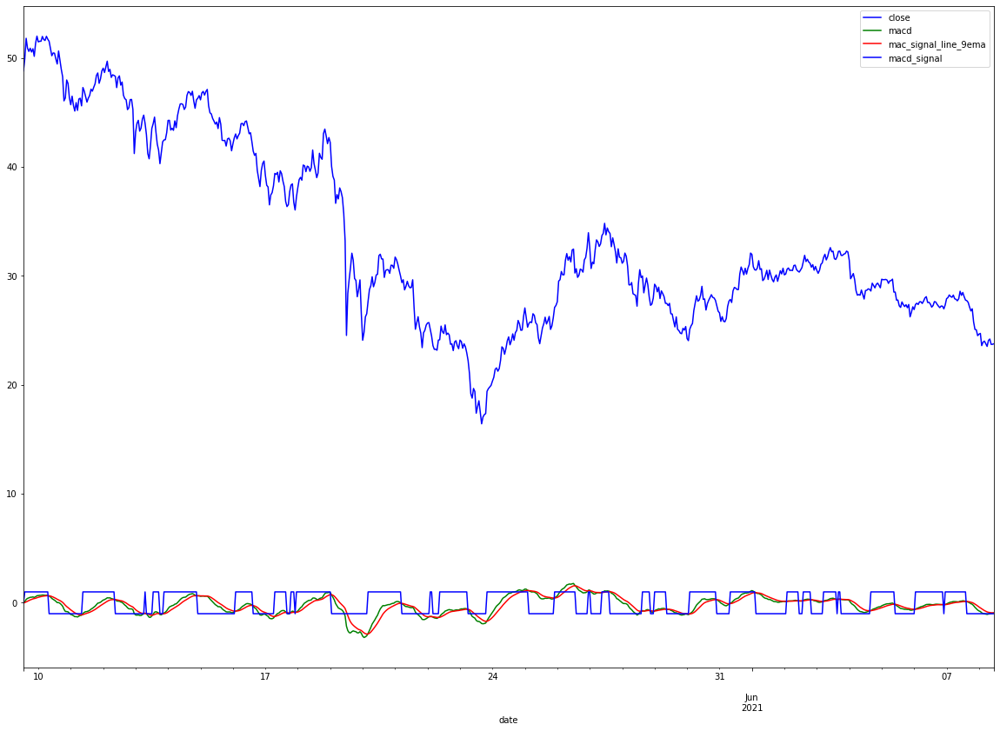

In [22]:
#SKALVA
historical_prices_df[['close', 'macd','mac_signal_line_9ema', 'macd_signal']].plot(figsize=(20,14), color=['b', 'g', 'r', 'b'])

<AxesSubplot:xlabel='date'>

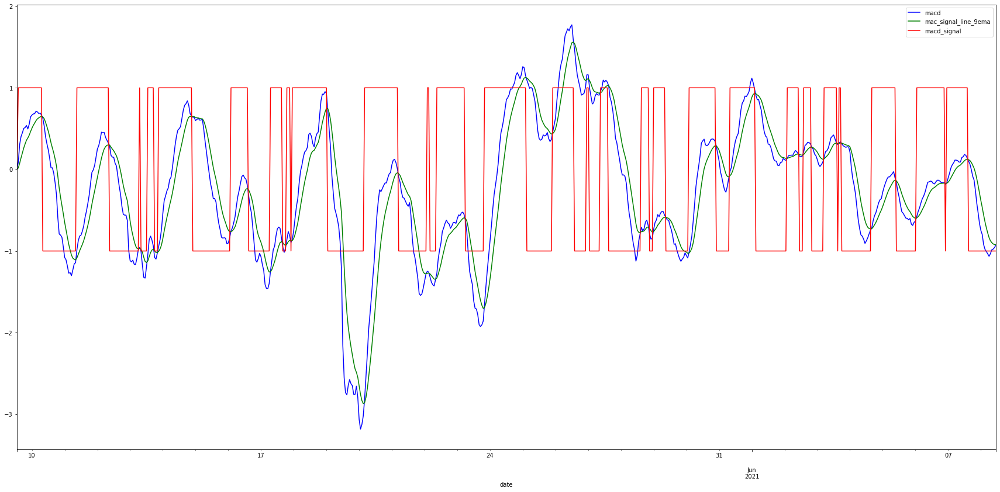

In [23]:
historical_prices_df[['macd','mac_signal_line_9ema', 'macd_signal']].plot(figsize=(30,14), color=['b', 'g', 'r'])

### Build RSI Signals

In [24]:
n = 14

def rma(x, n, y0):
    a = (n-1) / n
    ak = a**np.arange(len(x)-1, -1, -1)
    return np.r_[np.full(n, np.nan), y0, np.cumsum(ak * x) / ak / n + y0 * a**np.arange(1, len(x)+1)]

historical_prices_df['change'] = historical_prices_df['close'].diff()
historical_prices_df['gain'] = historical_prices_df.change.mask(historical_prices_df.change < 0, 0.0)
historical_prices_df['loss'] = -historical_prices_df.change.mask(historical_prices_df.change > 0, -0.0)
historical_prices_df['avg_gain'] = rma(historical_prices_df.gain[n+1:].to_numpy(), n, np.nansum(historical_prices_df.gain.to_numpy()[:n+1])/n)
historical_prices_df['avg_loss'] = rma(historical_prices_df.loss[n+1:].to_numpy(), n, np.nansum(historical_prices_df.loss.to_numpy()[:n+1])/n)
historical_prices_df['rs'] = historical_prices_df.avg_gain / historical_prices_df.avg_loss
historical_prices_df['rsi_14'] = 100 - (100 / (1 + historical_prices_df.rs))

historical_prices_df.head()

,timestamp,open,high,low,close,volume,date,daily_return,EMA_9,EMA_20,...,macd_diff_gradient,macd_conservative_long_exit,macd_conservative_short_exit,change,gain,loss,avg_gain,avg_loss,rs,rsi_14
date,,,,,,,,,,,,,,,,,,,,,
2021-05-09 13:00:00,1620565200000,48.15448,48.81072,48.15448,48.81072,834.732460,2021-05-09 13:00:00,0.023348,48.810720,48.810720,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-05-09 14:00:00,1620568800000,48.86427,49.91365,48.75978,49.91365,1307.732680,2021-05-09 14:00:00,0.022596,49.383410,49.371740,...,inf,0.0,1.0,1.10293,1.10293,0.00000,NaN,NaN,NaN,NaN
2021-05-09 15:00:00,1620572400000,49.86212,51.80152,49.79133,51.80152,2582.096918,2021-05-09 15:00:00,0.037823,50.252259,50.209893,...,2.283766,0.0,1.0,1.88787,1.88787,0.00000,NaN,NaN,NaN,NaN
2021-05-09 16:00:00,1620576000000,51.86890,52.31117,50.75032,50.89869,4851.980910,2021-05-09 16:00:00,-0.017429,50.432987,50.391145,...,0.131234,0.0,1.0,-0.90283,0.00000,0.90283,NaN,NaN,NaN,NaN
2021-05-09 17:00:00,1620579600000,50.78164,51.04909,50.38189,50.59835,762.838726,2021-05-09 17:00:00,-0.005901,50.471339,50.435507,...,-0.057923,-1.0,0.0,-0.30034,0.00000,0.30034,NaN,NaN,NaN,NaN


In [25]:
# Construct a rsi trading signal
historical_prices_df['rsi_oversold'] = np.where(historical_prices_df['rsi_14'] < 30, 1.0, 0.0)
historical_prices_df['rsi_overbought'] = np.where(historical_prices_df['rsi_14'] > 70, 1.0, 0.0)


# Set x variable list of features
rsi_list = ['close', 'daily_return', 'rs', 'rsi_14', 'rsi_overbought', 'rsi_oversold']

historical_prices_df[rsi_list].iloc[50:100]
# historical_prices_df.head()

,close,daily_return,rs,rsi_14,rsi_overbought,rsi_oversold
date,,,,,,
2021-05-11 15:00:00,47.13410,0.012454,1.009740,50.242308,0.0,0.0
2021-05-11 16:00:00,46.94687,-0.003972,0.966727,49.154097,0.0,0.0
2021-05-11 17:00:00,47.30236,0.007572,1.053828,51.310431,0.0,0.0
2021-05-11 18:00:00,47.62206,0.006759,1.138186,53.231375,0.0,0.0
2021-05-11 19:00:00,48.38680,0.016059,1.355496,57.546091,0.0,0.0
2021-05-11 20:00:00,48.61872,0.004793,1.426468,58.787835,0.0,0.0
2021-05-11 21:00:00,47.66812,-0.019552,1.086187,52.065656,0.0,0.0
2021-05-11 22:00:00,48.07519,0.008540,1.196197,54.466740,0.0,0.0
2021-05-11 23:00:00,48.80319,0.015143,1.408071,58.472991,0.0,0.0


In [26]:
# Create a lagging window in which you get a buy/sell signal

rolling_periods = 15

rsi_list = ['close', 'daily_return', 'rs', 'rsi_14', 'rsi_overbought', 'rsi_oversold', 'rsi_overbought_preceeding_periods', 'rsi_oversold_preceeding_periods']


historical_prices_df['rsi_oversold_preceeding_periods'] = historical_prices_df['rsi_oversold'].rolling(rolling_periods, min_periods=1).sum()
historical_prices_df['rsi_overbought_preceeding_periods'] = historical_prices_df['rsi_overbought'].rolling(rolling_periods, min_periods=1).sum()

historical_prices_df['rsi_short'] = np.where(historical_prices_df['rsi_overbought_preceeding_periods'] > 0, -1.0, 0.0)
historical_prices_df['rsi_long'] = np.where(historical_prices_df['rsi_oversold_preceeding_periods'] > 0, 1.0, 0.0)

historical_prices_df['rsi_signal'] = historical_prices_df['rsi_long'] + historical_prices_df['rsi_short']


rsi_list = ['rs',	'rsi_14',	'rsi_overbought',	'rsi_oversold',	'rsi_overbought_preceeding_periods',	'rsi_oversold_preceeding_periods',	'rsi_long',	'rsi_short',	'rsi_signal']
# display(historical_prices_df[rsi_list].iloc[73:89])
display(historical_prices_df[rsi_list].iloc[195:230])

,rs,rsi_14,rsi_overbought,rsi_oversold,rsi_overbought_preceeding_periods,rsi_oversold_preceeding_periods,rsi_long,rsi_short,rsi_signal
date,,,,,,,,,
2021-05-17 16:00:00,0.502493,33.443963,0.0,0.0,0.0,1.0,1.0,0.0,1.0
2021-05-17 17:00:00,0.532914,34.764761,0.0,0.0,0.0,1.0,1.0,0.0,1.0
2021-05-17 18:00:00,0.753219,42.962068,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-17 19:00:00,0.873033,46.610670,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-17 20:00:00,0.895917,47.255063,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-17 21:00:00,0.645907,39.243222,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-17 22:00:00,0.572524,36.407955,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-17 23:00:00,0.777827,43.751563,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-18 00:00:00,0.932576,48.255592,0.0,0.0,0.0,0.0,0.0,0.0,0.0


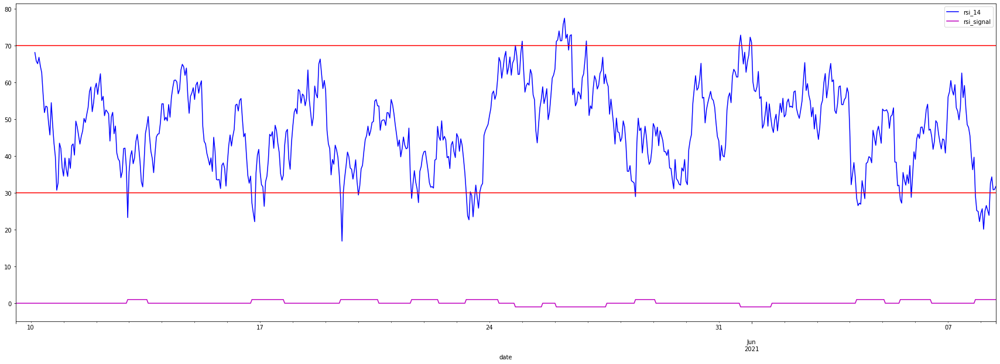

In [27]:
historical_prices_df[['rsi_14', 'rsi_signal']].plot(figsize=(30,10), color=['b', 'm'])
plt.axhline(y=70, color='r', linestyle='-')
plt.axhline(y=30, color='r', linestyle='-')

In [28]:
historical_prices_df.head()

,timestamp,open,high,low,close,volume,date,daily_return,EMA_9,EMA_20,...,avg_loss,rs,rsi_14,rsi_oversold,rsi_overbought,rsi_oversold_preceeding_periods,rsi_overbought_preceeding_periods,rsi_short,rsi_long,rsi_signal
date,,,,,,,,,,,,,,,,,,,,,
2021-05-09 13:00:00,1620565200000,48.15448,48.81072,48.15448,48.81072,834.732460,2021-05-09 13:00:00,0.023348,48.810720,48.810720,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-09 14:00:00,1620568800000,48.86427,49.91365,48.75978,49.91365,1307.732680,2021-05-09 14:00:00,0.022596,49.383410,49.371740,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-09 15:00:00,1620572400000,49.86212,51.80152,49.79133,51.80152,2582.096918,2021-05-09 15:00:00,0.037823,50.252259,50.209893,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-09 16:00:00,1620576000000,51.86890,52.31117,50.75032,50.89869,4851.980910,2021-05-09 16:00:00,-0.017429,50.432987,50.391145,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-09 17:00:00,1620579600000,50.78164,51.04909,50.38189,50.59835,762.838726,2021-05-09 17:00:00,-0.005901,50.471339,50.435507,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 2. Strategy Development

In [29]:
for col in historical_prices_df.columns:
    print(col)

timestamp
open
high
low
close
volume
date
daily_return
EMA_9
EMA_20
EMA_50
EMA_200
crossover_long_9v20
crossover_short_9v20
crossover_signal_9v20
crossover_long_50v200
crossover_short_50v200
crossover_signal_50v200
bollinger_mid_band
bollinger_std
bollinger_upper_band
bollinger_lower_band
bollinger_long
bollinger_short
bollinger_signal
mac_fast_12
mac_slow_26
macd
mac_signal_line_9ema
macd_diff
macd_long
macd_short
macd_signal
macd_diff_shift
macd_diff_gradient
macd_conservative_long_exit
macd_conservative_short_exit
change
gain
loss
avg_gain
avg_loss
rs
rsi_14
rsi_oversold
rsi_overbought
rsi_oversold_preceeding_periods
rsi_overbought_preceeding_periods
rsi_short
rsi_long
rsi_signal


### Define Strategies. 
 > Strategy 1 = EMA50v200 + BB <br />
 > Strategy 2 = MACD & RSI <br />
 > Strategy 3 = EMA50v200 + MACD <br />
 > Strategy 4 = EMA50v200 + EMA9v20 <br />

In [30]:
# Set x variable list of features
st1_x_var_list = ['close', 'crossover_signal_50v200', 'bollinger_signal']
st2_x_var_list = ['close', 'rsi_signal', 'macd_signal']
st3_x_var_list = ['close', 'crossover_signal_50v200', 'macd_signal']
st4_x_var_list = ['close', 'crossover_signal_50v200', 'crossover_signal_9v20']

## Strategy 1 - EMA50V200 + Bollinger

In [31]:
historical_prices_df[st1_x_var_list]

,close,crossover_signal_50v200,bollinger_signal
date,,,
2021-05-09 13:00:00,48.81072,0.0,0.0
2021-05-09 14:00:00,49.91365,1.0,0.0
2021-05-09 15:00:00,51.80152,1.0,0.0
2021-05-09 16:00:00,50.89869,1.0,0.0
2021-05-09 17:00:00,50.59835,1.0,0.0
...,...,...,...
2021-06-08 07:00:00,24.08114,-1.0,0.0
2021-06-08 08:00:00,24.20431,-1.0,0.0
2021-06-08 09:00:00,23.71481,-1.0,0.0


In [32]:
# Filter by x-variable list
strategy_1 = historical_prices_df[st1_x_var_list]


# shift the bollinger signal down, to help find the OPTIMAL Buy/sell time 
strategy_1['bollinger_shift'] = strategy_1['bollinger_signal'].shift(1)


# Define long and short position conditions
strategy_1['bull_or_bear'] = np.where(strategy_1['crossover_signal_50v200'] == -1, "Bear", "Bull")

# strategy_1.iloc[509:528]
strategy_1.tail(20)

,close,crossover_signal_50v200,bollinger_signal,bollinger_shift,bull_or_bear
date,,,,,
2021-06-07 16:00:00,27.56547,-1.0,0.0,0.0,Bear
2021-06-07 17:00:00,27.13928,-1.0,1.0,0.0,Bear
2021-06-07 18:00:00,26.78390,-1.0,1.0,1.0,Bear
2021-06-07 19:00:00,26.97757,-1.0,1.0,1.0,Bear
2021-06-07 20:00:00,25.77915,-1.0,1.0,1.0,Bear
2021-06-07 21:00:00,25.08813,-1.0,1.0,1.0,Bear
2021-06-07 22:00:00,25.05191,-1.0,1.0,1.0,Bear
2021-06-07 23:00:00,24.51449,-1.0,1.0,1.0,Bear
2021-06-08 00:00:00,24.65069,-1.0,1.0,1.0,Bear


## Program the Conditional Logic for the Trading Strategy

In [33]:
# IF BEAR + BOLLINGER BUY (1), Position = 0
# IF BEAR + BOLLINGER SELL (-1), Position = -1
# IF BULL + BOLLINGER BUY (1), Position = 1
# IF BULL + BOLLINGER SELL (-1), Position = 0

In [34]:
st1_position_code = 0
st1_positions = []

for index, row in strategy_1.iterrows():


    # BUY SIGNALS, ONLY ENTERING TRADE WHEN PRICE REENTERS FAIR TRADING ZONE
    
    # IF BEAR + BOLL (WAS JUST) == -1, EXIT SHORT (BUY OUT)
    if (row['crossover_signal_50v200'] == -1) & (row['bollinger_signal'] == 0) & (row['bollinger_shift'] == -1):
        st1_position_code = -1
        st1_positions.append(st1_position_code)
    
    
    # ELIF BULL + BOLL == 1 BUY
    elif (row['crossover_signal_50v200'] == 1) & (row['bollinger_signal'] == 0) & (row['bollinger_shift'] == 1):
        st1_position_code = 1
        st1_positions.append(st1_position_code)  



    # EXIT SIGNALS. LESS CONDITIONS. SELL THE SECOND TRADING CONDITIONS AREN'T FAVOURABLE


    # ELIF BEAR + BOLL == 1, EXIT SHORT / NO POSITION
    elif (row['crossover_signal_50v200'] == -1) & (row['bollinger_signal'] == 1) & (row['bollinger_shift'] != 1):
        st1_position_code = 0
        st1_positions.append(st1_position_code)
    
    
    
    # ELIF BULL + BOLL == -1, EXIT LONG / NO POSITION
    elif (row['crossover_signal_50v200'] == 1) & (row['bollinger_signal'] == -1) & (row['bollinger_shift'] == -1):
        st1_position_code = 0
        st1_positions.append(st1_position_code) 

    
    # ELSE : O / NA
    else:
        st1_position_code = st1_position_code
        st1_positions.append(st1_position_code)
        # st1_positions.append(f"{index}: {st1_position}, {st1_position_code}")

# Double check the dataframes have the same row lengths
display(len(st1_positions))
display(strategy_1.shape)
display(historical_prices_df.shape)

719

(719, 5)

(719, 51)

In [35]:
strategy_1['boll_ema50200_position'] = st1_positions
historical_prices_df['st1_boll_ema50200_position'] = st1_positions
# strategy_1[130:170]
strategy_1[695:830]

,close,crossover_signal_50v200,bollinger_signal,bollinger_shift,bull_or_bear,boll_ema50200_position
date,,,,,,
2021-06-07 12:00:00,28.47458,-1.0,-1.0,-1.0,Bear,-1
2021-06-07 13:00:00,28.09572,-1.0,0.0,-1.0,Bear,-1
2021-06-07 14:00:00,27.77930,-1.0,0.0,0.0,Bear,-1
2021-06-07 15:00:00,27.72525,-1.0,0.0,0.0,Bear,-1
2021-06-07 16:00:00,27.56547,-1.0,0.0,0.0,Bear,-1
2021-06-07 17:00:00,27.13928,-1.0,1.0,0.0,Bear,0
2021-06-07 18:00:00,26.78390,-1.0,1.0,1.0,Bear,0
2021-06-07 19:00:00,26.97757,-1.0,1.0,1.0,Bear,0
2021-06-07 20:00:00,25.77915,-1.0,1.0,1.0,Bear,0


In [36]:
strategy_1['boll_ema50200_position_shift'] = strategy_1['boll_ema50200_position'].shift(1)
strategy_1[50:100]

,close,crossover_signal_50v200,bollinger_signal,bollinger_shift,bull_or_bear,boll_ema50200_position,boll_ema50200_position_shift
date,,,,,,,
2021-05-11 15:00:00,47.13410,-1.0,-1.0,0.0,Bear,0,0.0
2021-05-11 16:00:00,46.94687,-1.0,0.0,-1.0,Bear,-1,0.0
2021-05-11 17:00:00,47.30236,-1.0,-1.0,0.0,Bear,-1,-1.0
2021-05-11 18:00:00,47.62206,-1.0,-1.0,-1.0,Bear,-1,-1.0
2021-05-11 19:00:00,48.38680,-1.0,-1.0,-1.0,Bear,-1,-1.0
2021-05-11 20:00:00,48.61872,-1.0,-1.0,-1.0,Bear,-1,-1.0
2021-05-11 21:00:00,47.66812,-1.0,-1.0,-1.0,Bear,-1,-1.0
2021-05-11 22:00:00,48.07519,-1.0,-1.0,-1.0,Bear,-1,-1.0
2021-05-11 23:00:00,48.80319,-1.0,-1.0,-1.0,Bear,-1,-1.0


In [37]:
st1_signal_text = 'No Position - hold'
st1_signals = []

for index, row in strategy_1.iterrows():

    # POsition = 0 : Former_Position = -1 : Signal = ‘Close Short’
    if (row['boll_ema50200_position'] == 0) & (row['boll_ema50200_position_shift'] == -1):
        st1_signal_text = 'Close Short'
        st1_signals.append(st1_signal_text)

    # POsition = 0:  Former_Position =1 : Signal = 'Close Long’
    elif (row['boll_ema50200_position'] == 0) & (row['boll_ema50200_position_shift'] == 1):
        st1_signal_text = 'Close Long'
        st1_signals.append(st1_signal_text)

    # POsition = 0 : Former_Position = 0 : Signal = Hold No Position
    elif (row['boll_ema50200_position'] == 0) & (row['boll_ema50200_position_shift'] == 0):
        st1_signal_text = 'No Position - hold'
        st1_signals.append(st1_signal_text)


    # POsition = -1  Former_Position =: 0 : Signal = ‘Sell Short’
    elif (row['boll_ema50200_position'] == -1) & (row['boll_ema50200_position_shift'] == 0):
        st1_signal_text = 'Sell Short'
        st1_signals.append(st1_signal_text)


    # POsition = -1  Former_Position =: -1 : Signal = ‘Hold Short Position’
    elif (row['boll_ema50200_position'] == -1) & (row['boll_ema50200_position_shift'] == -1):
        st1_signal_text = 'Hold Short Position'
        st1_signals.append(st1_signal_text)


    # POsition = -1: Former_Position = 1 : Signal = ‘Close Long Position, Enter short Position’
    elif (row['boll_ema50200_position'] == -1) & (row['boll_ema50200_position_shift'] == 1):
        st1_signal_text = '‘Close Long Position, Enter short Position'
        st1_signals.append(st1_signal_text)


    # POsition = 1 : Former_Position = 1 : Signal = ‘Hold Long Position’
    elif (row['boll_ema50200_position'] == 1) & (row['boll_ema50200_position_shift'] == 1):
        st1_signal_text = 'Hold Long Position'
        st1_signals.append(st1_signal_text)


    # POsition = 1 : Former_Position = -1 : Signal = ‘Close Short Position, Enter Long Position’
    elif (row['boll_ema50200_position'] == 1) & (row['boll_ema50200_position_shift'] == -1):
        st1_signal_text = 'Close Short Position, Enter Long Position'
        st1_signals.append(st1_signal_text)


    # POsition = 1 : Former_Position = 0 : Signal = ‘Enter Long Position’
    elif (row['boll_ema50200_position'] == 1) & (row['boll_ema50200_position_shift'] == 0):
        st1_signal_text = 'Enter Long Position'
        st1_signals.append(st1_signal_text)


    # Else, Signal = none
    else:
        st1_signal_text = st1_signal_text
        st1_signals.append(st1_signal_text)


strategy_1['boll_ema50200_signals'] = st1_signals
historical_prices_df['st1_boll_ema50200_signals'] = st1_signals
strategy_1[300:350]

,close,crossover_signal_50v200,bollinger_signal,bollinger_shift,bull_or_bear,boll_ema50200_position,boll_ema50200_position_shift,boll_ema50200_signals
date,,,,,,,,
2021-05-22 01:00:00,25.71049,-1.0,0.0,0.0,Bear,0,0.0,No Position - hold
2021-05-22 02:00:00,25.10623,-1.0,0.0,0.0,Bear,0,0.0,No Position - hold
2021-05-22 03:00:00,24.47296,-1.0,0.0,0.0,Bear,0,0.0,No Position - hold
2021-05-22 04:00:00,23.59496,-1.0,1.0,0.0,Bear,0,0.0,No Position - hold
2021-05-22 05:00:00,23.25600,-1.0,1.0,1.0,Bear,0,0.0,No Position - hold
2021-05-22 06:00:00,23.27434,-1.0,1.0,1.0,Bear,0,0.0,No Position - hold
2021-05-22 07:00:00,23.17507,-1.0,1.0,1.0,Bear,0,0.0,No Position - hold
2021-05-22 08:00:00,24.10550,-1.0,0.0,1.0,Bear,0,0.0,No Position - hold
2021-05-22 09:00:00,24.13861,-1.0,0.0,0.0,Bear,0,0.0,No Position - hold


In [47]:
historical_prices_df.head(4)
historical_prices_df['st1_boll_ema50200_signals'].to_csv("sreeni3.csv)")

In [59]:
#Backtesting Code for Strategy#1

new_df = historical_prices_df[['close', 'st1_boll_ema50200_signals']].copy()
index_names = new_df[ (new_df['st1_boll_ema50200_signals'] == 'No Position - hold')].index
new_df.drop(index_names, inplace = True)
index_names = new_df[ (new_df['st1_boll_ema50200_signals'] == 'Hold Short Position')].index
new_df.drop(index_names, inplace = True)

# Set initial capital
initial_capital = float(100000)

# Set the share size
share_size = 1000

portfolio_value = initial_capital

for index, row in new_df.iterrows():
    if (row['st1_boll_ema50200_signals'] == "Sell Short"):
        portfolio_value = round(portfolio_value + (share_size * row['close']),2)
        #print(f"I am selling. Portfolio value: {portfolio_value}")
    elif (row['st1_boll_ema50200_signals'] == "Close Short"):
        portfolio_value = round(portfolio_value - (share_size * row['close']),2)
        #print(f"I am buying. Portfolio value: {portfolio_value} ")

print(f"Strategy#1 BackTesting Values: Initial Capital of ${initial_capital}, Share_Size of {share_size}, Portfolio_Value_At_the_End_of_Period:${portfolio_value}")


30
Strategy#1 BackTesting Values: Initial Capital of $100000.0, Share_Size of 1000, Portfolio_Value_At_the_End_of_Period:$103904.45


In [39]:
# Backtest the Trading Strategy #1

# Set initial capital
initial_capital = float(100000)

# Set the share size
share_size = 500

# Take a 500 share position where the dual moving average crossover is 1 (SMA50 is greater than SMA100)
signals_df['Position'] = share_size * signals_df['Entry/Exit']

# Find the points in time where a 500 share position is bought or sold
signals_df['Entry/Exit Position'] = signals_df['Position'].diff()

# Multiply share price by entry/exit positions and get the cumulatively sum
signals_df['Portfolio Holdings'] = signals_df['close'] * signals_df['Entry/Exit Position'].cumsum()

# Subtract the initial capital by the portfolio holdings to get the amount of liquid cash in the portfolio
signals_df['Portfolio Cash'] = initial_capital - (signals_df['close'] * signals_df['Entry/Exit Position']).cumsum()

# Get the total portfolio value by adding the cash amount by the portfolio holdings (or investments)
signals_df['Portfolio Total'] = signals_df['Portfolio Cash'] + signals_df['Portfolio Holdings']

# Calculate the portfolio daily returns
signals_df['Portfolio Daily Returns'] = signals_df['Portfolio Total'].pct_change()

# Calculate the cumulative returns
signals_df['Portfolio Cumulative Returns'] = (1 + signals_df['Portfolio Daily Returns']).cumprod() - 1

# Print the DataFrame
signals_df.tail(10)


NameError: name 'signals_df' is not defined

In [ ]:
#Plot Entry/Exit Points of Backtest Results

# Visualize exit position relative to total portfolio value
exit = signals_df[signals_df['Entry/Exit'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='red',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
entry = signals_df[signals_df['Entry/Exit'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='green',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize total portoflio value for the investment
total_portfolio_value = signals_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Overlay plots
portfolio_entry_exit_plot = total_portfolio_value * entry * exit
portfolio_entry_exit_plot.opts(xaxis=None)

## Strategy 2 - RSI + MACD

In [132]:
st2_x_var_list = ['close', 'rsi_signal', 'macd_signal', 'macd_conservative_long_exit', 'macd_conservative_short_exit']

historical_prices_df[st2_x_var_list].head(20)

,close,rsi_signal,macd_signal,macd_conservative_long_exit,macd_conservative_short_exit
date,,,,,
2021-05-09 12:00:00,47.69708,0.0,0.0,0.0,0.0
2021-05-09 13:00:00,48.81072,0.0,1.0,0.0,1.0
2021-05-09 14:00:00,49.91365,0.0,1.0,0.0,1.0
2021-05-09 15:00:00,51.80152,0.0,1.0,0.0,1.0
2021-05-09 16:00:00,50.89869,0.0,1.0,0.0,1.0
2021-05-09 17:00:00,50.59835,0.0,1.0,-1.0,0.0
2021-05-09 18:00:00,50.88990,0.0,1.0,-1.0,0.0
2021-05-09 19:00:00,50.54297,0.0,1.0,-1.0,0.0
2021-05-09 20:00:00,50.84000,0.0,1.0,-1.0,0.0


In [133]:
# Filter by x-variable list
strategy_2 = historical_prices_df[st2_x_var_list]

# Define long and short position conditions

environment = 'none'
environments = []

for index, row in strategy_2.iterrows():

    # If RSI signal == 1, OVERSOLD. I.e. enter long position
    if (row['rsi_signal'] == 1):
        environment = "Oversold. LONG!"
        environments.append(environment)
    
    # If RSI signal == -1, OVERBOUGHT. I.e. enter short position
    elif (row['rsi_signal'] == -1):
        environment = "Overbought. SELL!"
        environments.append(environment)
    
    # Else, price is fair
    else:
        environment = "Fair price"
        environments.append(environment)

display(len(environments))
display(strategy_2.shape)
display(historical_prices_df.shape)


719

(719, 5)

(719, 53)

In [134]:
strategy_2['rsi_window'] = environments
# historical_prices_df['rsi_window'] = environments
# strategy_2[130:170]
strategy_2[50:100]

,close,rsi_signal,macd_signal,macd_conservative_long_exit,macd_conservative_short_exit,rsi_window
date,,,,,,
2021-05-11 14:00:00,46.55429,0.0,1.0,0.0,1.0,Fair price
2021-05-11 15:00:00,47.13410,0.0,1.0,0.0,1.0,Fair price
2021-05-11 16:00:00,46.94687,0.0,1.0,0.0,1.0,Fair price
2021-05-11 17:00:00,47.30236,0.0,1.0,0.0,1.0,Fair price
2021-05-11 18:00:00,47.62206,0.0,1.0,0.0,1.0,Fair price
2021-05-11 19:00:00,48.38680,0.0,1.0,0.0,1.0,Fair price
2021-05-11 20:00:00,48.61872,0.0,1.0,0.0,1.0,Fair price
2021-05-11 21:00:00,47.66812,0.0,1.0,-1.0,0.0,Fair price
2021-05-11 22:00:00,48.07519,0.0,1.0,-1.0,0.0,Fair price


In [135]:
# CREATE A MACD SIGNAL SHIFT 
strategy_2['macd_signal_shift'] = strategy_2['macd_signal'].shift(1)
strategy_2.head()

,close,rsi_signal,macd_signal,macd_conservative_long_exit,macd_conservative_short_exit,rsi_window,macd_signal_shift
date,,,,,,,
2021-05-09 12:00:00,47.69708,0.0,0.0,0.0,0.0,Fair price,NaN
2021-05-09 13:00:00,48.81072,0.0,1.0,0.0,1.0,Fair price,0.0
2021-05-09 14:00:00,49.91365,0.0,1.0,0.0,1.0,Fair price,1.0
2021-05-09 15:00:00,51.80152,0.0,1.0,0.0,1.0,Fair price,1.0
2021-05-09 16:00:00,50.89869,0.0,1.0,0.0,1.0,Fair price,1.0


### Program the Conditional Logic for the Trading Strategy

### Aggresive Macd. i.e hold until the next macd cross

In [136]:
st2_position_code = 0
st2_positions = []

for index, row in strategy_2.iterrows():


    ## RSI OVERSOLD SCENARIOS


    # IF RSI == OVERSOLD (1) AND MACD CROSSES SIGNAL (1), BUY
    if (row['rsi_signal'] == 1) & (row['macd_signal'] == 1) & (row['macd_signal_shift'] != 1):
        st2_position_code = 1
        st2_positions.append(st2_position_code)

    
    # IF RSI == OVERSOLD (1) AND MACD CROSSES SIGNAL NEGATIVELY (-1), SELL
    elif (row['rsi_signal'] == 1) & (row['macd_signal'] == -1) & (row['macd_signal_shift'] != -1):
        st2_position_code = 0
        st2_positions.append(st2_position_code)
    


    ## RSI OVERBOUGHT SCENARIOS


    # IF RSI == OVERBOUGHT (-1) AND MACD CROSSES SIGNAL NEGATIVELY (-1), SELL
    elif (row['rsi_signal'] == -1) & (row['macd_signal'] == -1) & (row['macd_signal_shift'] != -1):
        st2_position_code = -1
        st2_positions.append(st2_position_code)
    
    
    # IF RSI == OVERBOUGHT (-1) AND MACD CROSSES SIGNAL (1), BUY
    elif (row['rsi_signal'] == -1) & (row['macd_signal'] == 1) & (row['macd_signal_shift'] != 1):
        st2_position_code = 0
        st2_positions.append(st2_position_code)



    ## RSI FAIR SCENARIOS


    # # IF RSI == FAIR (0) AND MACD GOES FROM 1 to -1
    elif (row['rsi_signal'] == 0) & (row['macd_signal'] == -1) & (row['macd_signal_shift'] != -1):
        st2_position_code = 0
        st2_positions.append(st2_position_code)

    
    # # IF RSI == FAIR (0) AND MACD GOES FROM -1 to 1
    elif (row['rsi_signal'] == 0) & (row['macd_signal'] == 1) & (row['macd_signal_shift'] != 1):
        st2_position_code = 0
        st2_positions.append(st2_position_code)


    ## OTHER



    # ELSE : 0 / NA
    else:
        st2_position_code = st2_position_code
        st2_positions.append(st2_position_code)


display(len(st2_positions))
display(strategy_2.shape)
display(historical_prices_df.shape)

719

(719, 7)

(719, 53)

In [137]:
strategy_2['rsi_macd_agg_position'] = st2_positions
historical_prices_df['st2_rsi_macd_agg_position'] = st2_positions
# strategy_2[130:170]
# strategy_2[400:450]
strategy_2.head()

,close,rsi_signal,macd_signal,macd_conservative_long_exit,macd_conservative_short_exit,rsi_window,macd_signal_shift,rsi_macd_agg_position
date,,,,,,,,
2021-05-09 12:00:00,47.69708,0.0,0.0,0.0,0.0,Fair price,NaN,0
2021-05-09 13:00:00,48.81072,0.0,1.0,0.0,1.0,Fair price,0.0,0
2021-05-09 14:00:00,49.91365,0.0,1.0,0.0,1.0,Fair price,1.0,0
2021-05-09 15:00:00,51.80152,0.0,1.0,0.0,1.0,Fair price,1.0,0
2021-05-09 16:00:00,50.89869,0.0,1.0,0.0,1.0,Fair price,1.0,0


In [138]:
strategy_2['rsi_macd_agg_position_shift'] = strategy_2['rsi_macd_agg_position'].shift(1)
# strategy_2[50:100]
strategy_2.head()

,close,rsi_signal,macd_signal,macd_conservative_long_exit,macd_conservative_short_exit,rsi_window,macd_signal_shift,rsi_macd_agg_position,rsi_macd_agg_position_shift
date,,,,,,,,,
2021-05-09 12:00:00,47.69708,0.0,0.0,0.0,0.0,Fair price,NaN,0,NaN
2021-05-09 13:00:00,48.81072,0.0,1.0,0.0,1.0,Fair price,0.0,0,0.0
2021-05-09 14:00:00,49.91365,0.0,1.0,0.0,1.0,Fair price,1.0,0,0.0
2021-05-09 15:00:00,51.80152,0.0,1.0,0.0,1.0,Fair price,1.0,0,0.0
2021-05-09 16:00:00,50.89869,0.0,1.0,0.0,1.0,Fair price,1.0,0,0.0


In [139]:
st2_signal = 'NA'
st2_signal_text = 'No Position - hold'
st2_signals = []

for index, row in strategy_2.iterrows():

    # POsition = 0 : Former_Position = -1 : Signal = ‘Close Short’
    if (row['rsi_macd_agg_position'] == 0) & (row['rsi_macd_agg_position_shift'] == -1):
        st2_signal_text = 'Close Short'
        st2_signals.append(st2_signal_text)

    # POsition = 0:  Former_Position =1 : Signal = 'Close Long’
    elif (row['rsi_macd_agg_position'] == 0) & (row['rsi_macd_agg_position_shift'] == 1):
        st2_signal_text = 'Close Long'
        st2_signals.append(st2_signal_text)

    # POsition = 0 : Former_Position = 0 : Signal = Hold No Position
    elif (row['rsi_macd_agg_position'] == 0) & (row['rsi_macd_agg_position_shift'] == 0):
        st2_signal_text = 'No Position - hold'
        st2_signals.append(st2_signal_text)


    # POsition = -1  Former_Position =: 0 : Signal = ‘Sell Short’
    elif (row['rsi_macd_agg_position'] == -1) & (row['rsi_macd_agg_position_shift'] == 0):
        st2_signal_text = 'Sell Short'
        st2_signals.append(st2_signal_text)


    # POsition = -1  Former_Position =: -1 : Signal = ‘Hold Short Position’
    elif (row['rsi_macd_agg_position'] == -1) & (row['rsi_macd_agg_position_shift'] == -1):
        st2_signal_text = 'Hold Short Position'
        st2_signals.append(st2_signal_text)


    # POsition = -1: Former_Position = 1 : Signal = ‘Close Long Position, Enter short Position’
    elif (row['rsi_macd_agg_position'] == -1) & (row['rsi_macd_agg_position_shift'] == 1):
        st2_signal_text = '‘Close Long Position, Enter short Position'
        st2_signals.append(st2_signal_text)


    # POsition = 1 : Former_Position = 1 : Signal = ‘Hold Long Position’
    elif (row['rsi_macd_agg_position'] == 1) & (row['rsi_macd_agg_position_shift'] == 1):
        st2_signal_text = 'Hold Long Position'
        st2_signals.append(st2_signal_text)


    # POsition = 1 : Former_Position = -1 : Signal = ‘Close Short Position, Enter Long Position’
    elif (row['rsi_macd_agg_position'] == 1) & (row['rsi_macd_agg_position_shift'] == -1):
        st2_signal_text = 'Close Short Position, Enter Long Position'
        st2_signals.append(st2_signal_text)


    # POsition = 1 : Former_Position = 0 : Signal = ‘Enter Long Position’
    elif (row['rsi_macd_agg_position'] == 1) & (row['rsi_macd_agg_position_shift'] == 0):
        st2_signal_text = 'Enter Long Position'
        st2_signals.append(st2_signal_text)


    # Else, Signal = none
    else:
        st2_signal_text = st2_signal_text
        st2_signals.append(st2_signal_text)


strategy_2['rsi_macd_agg_signals'] = st2_signals
historical_prices_df['st2_rsi_macd_agg_signals'] = st2_signals
strategy_2[50:100]

,close,rsi_signal,macd_signal,macd_conservative_long_exit,macd_conservative_short_exit,rsi_window,macd_signal_shift,rsi_macd_agg_position,rsi_macd_agg_position_shift,rsi_macd_agg_signals
date,,,,,,,,,,
2021-05-11 14:00:00,46.55429,0.0,1.0,0.0,1.0,Fair price,1.0,0,0.0,No Position - hold
2021-05-11 15:00:00,47.13410,0.0,1.0,0.0,1.0,Fair price,1.0,0,0.0,No Position - hold
2021-05-11 16:00:00,46.94687,0.0,1.0,0.0,1.0,Fair price,1.0,0,0.0,No Position - hold
2021-05-11 17:00:00,47.30236,0.0,1.0,0.0,1.0,Fair price,1.0,0,0.0,No Position - hold
2021-05-11 18:00:00,47.62206,0.0,1.0,0.0,1.0,Fair price,1.0,0,0.0,No Position - hold
2021-05-11 19:00:00,48.38680,0.0,1.0,0.0,1.0,Fair price,1.0,0,0.0,No Position - hold
2021-05-11 20:00:00,48.61872,0.0,1.0,0.0,1.0,Fair price,1.0,0,0.0,No Position - hold
2021-05-11 21:00:00,47.66812,0.0,1.0,-1.0,0.0,Fair price,1.0,0,0.0,No Position - hold
2021-05-11 22:00:00,48.07519,0.0,1.0,-1.0,0.0,Fair price,1.0,0,0.0,No Position - hold


## Strategy 3 - EMA50V200 + MACD

In [140]:
historical_prices_df[st3_x_var_list].iloc[550:570]
historical_prices_df.shape

(719, 55)

In [141]:
# Filter by x-variable list
strategy_3 = historical_prices_df[st3_x_var_list]

# Define long and short position conditions
strategy_3['bull_or_bear'] = np.where(strategy_1['crossover_signal_50v200'] == -1, "Bear", "Bull")

# strategy_3.iloc[509:528]
strategy_3['macd_signal_shift'] = strategy_3['macd_signal'].shift(1)

strategy_3.head(5)

,close,crossover_signal_50v200,macd_signal,bull_or_bear,macd_signal_shift
date,,,,,
2021-05-09 12:00:00,47.69708,0.0,0.0,Bull,NaN
2021-05-09 13:00:00,48.81072,1.0,1.0,Bull,0.0
2021-05-09 14:00:00,49.91365,1.0,1.0,Bull,1.0
2021-05-09 15:00:00,51.80152,1.0,1.0,Bull,1.0
2021-05-09 16:00:00,50.89869,1.0,1.0,Bull,1.0


In [142]:
strategy_3.shape

(719, 5)

## Program the Conditional Logic for the Trading Strategy

In [143]:
st3_position_code = 0
st3_positions = []

for index, row in strategy_3.iterrows():
    
    # If EMA50v200 = 1 (BULL) and MACD CROSSES ABOVE SIGNAL (1) BUY
    if (row['crossover_signal_50v200'] == 1) & (row['macd_signal'] == 1) & (row['macd_signal_shift'] != 1):
        st3_position_code = 1
        st3_positions.append(st3_position_code)


    # If EMA50v200 = 1 (BULL) and MACD CROSSES BELOW SIGNAL (-1) No Position
    elif (row['crossover_signal_50v200'] == 1) & (row['macd_signal'] == -1) & (row['macd_signal_shift'] != -1):
        st3_position_code = 0
        st3_positions.append(st3_position_code)


    # If EMA50v200 = -1 (BEAR) and MACD CROSSES ABOVE SIGNAL (1) No Position
    elif (row['crossover_signal_50v200'] == -1) & (row['macd_signal'] == 1) & (row['macd_signal_shift'] != 1):
        st3_position_code = 0
        st3_positions.append(st3_position_code)



    # If EMA50v200 = -1 (BEAR) and MACD CROSSES BELOW SIGNAL (-1) SELL
    elif (row['crossover_signal_50v200'] == -1) & (row['macd_signal'] == -1) & (row['macd_signal_shift'] != -1):
        st3_position_code = -1
        st3_positions.append(st3_position_code)


    # ELSE : 0 / NA
    # This wasn't working as st3_position = st3_position??
    else:
        st3_position_code = st3_position_code
        st3_positions.append(st3_position_code)

    

# Double check the dataframes have the same row lengths
display(len(st3_positions))
display(strategy_3.shape)
display(historical_prices_df.shape)    

719

(719, 5)

(719, 55)

In [144]:
strategy_3['ema50200_macd_position'] = st3_positions
historical_prices_df['st3_ema50200_macd_position'] = st3_positions
strategy_3.head()

,close,crossover_signal_50v200,macd_signal,bull_or_bear,macd_signal_shift,ema50200_macd_position
date,,,,,,
2021-05-09 12:00:00,47.69708,0.0,0.0,Bull,NaN,0
2021-05-09 13:00:00,48.81072,1.0,1.0,Bull,0.0,1
2021-05-09 14:00:00,49.91365,1.0,1.0,Bull,1.0,1
2021-05-09 15:00:00,51.80152,1.0,1.0,Bull,1.0,1
2021-05-09 16:00:00,50.89869,1.0,1.0,Bull,1.0,1


### CALCULATE SIGNALS

In [145]:
strategy_3['ema50200_macd_position_shift'] = strategy_3['ema50200_macd_position'].shift(1)
strategy_3

,close,crossover_signal_50v200,macd_signal,bull_or_bear,macd_signal_shift,ema50200_macd_position,ema50200_macd_position_shift
date,,,,,,,
2021-05-09 12:00:00,47.69708,0.0,0.0,Bull,NaN,0,NaN
2021-05-09 13:00:00,48.81072,1.0,1.0,Bull,0.0,1,0.0
2021-05-09 14:00:00,49.91365,1.0,1.0,Bull,1.0,1,1.0
2021-05-09 15:00:00,51.80152,1.0,1.0,Bull,1.0,1,1.0
2021-05-09 16:00:00,50.89869,1.0,1.0,Bull,1.0,1,1.0
...,...,...,...,...,...,...,...
2021-06-08 06:00:00,23.52668,-1.0,-1.0,Bear,-1.0,-1,-1.0
2021-06-08 07:00:00,24.08114,-1.0,-1.0,Bear,-1.0,-1,-1.0
2021-06-08 08:00:00,24.20431,-1.0,-1.0,Bear,-1.0,-1,-1.0


In [146]:
st3_signal_text = 'No Position - hold'
st3_signals = []

for index, row in strategy_3.iterrows():

    # POsition = 0 : Former_Position = -1 : Signal = ‘Close Short’
    if (row['ema50200_macd_position'] == 0) & (row['ema50200_macd_position_shift'] == -1):
        st3_signal_text = 'Close Short'
        st3_signals.append(st3_signal_text)

    # POsition = 0:  Former_Position =1 : Signal = 'Close Long’
    elif (row['ema50200_macd_position'] == 0) & (row['ema50200_macd_position_shift'] == 1):
        st3_signal_text = 'Close Long'
        st3_signals.append(st3_signal_text)

    # POsition = 0 : Former_Position = 0 : Signal = Hold No Position
    elif (row['ema50200_macd_position'] == 0) & (row['ema50200_macd_position_shift'] == 0):
        st3_signal_text = 'No Position - hold'
        st3_signals.append(st3_signal_text)


    # POsition = -1  Former_Position =: 0 : Signal = ‘Sell Short’
    elif (row['ema50200_macd_position'] == -1) & (row['ema50200_macd_position_shift'] == 0):
        st3_signal_text = 'Sell Short'
        st3_signals.append(st3_signal_text)


    # POsition = -1  Former_Position =: -1 : Signal = ‘Hold Short Position’
    elif (row['ema50200_macd_position'] == -1) & (row['ema50200_macd_position_shift'] == -1):
        st3_signal_text = 'Hold Short Position'
        st3_signals.append(st3_signal_text)


    # POsition = -1: Former_Position = 1 : Signal = ‘Close Long Position, Enter short Position’
    elif (row['ema50200_macd_position'] == -1) & (row['ema50200_macd_position_shift'] == 1):
        st3_signal_text = '‘Close Long Position, Enter short Position'
        st3_signals.append(st3_signal_text)


    # POsition = 1 : Former_Position = 1 : Signal = ‘Hold Long Position’
    elif (row['ema50200_macd_position'] == 1) & (row['ema50200_macd_position_shift'] == 1):
        st3_signal_text = 'Hold Long Position'
        st3_signals.append(st3_signal_text)


    # POsition = 1 : Former_Position = -1 : Signal = ‘Close Short Position, Enter Long Position’
    elif (row['ema50200_macd_position'] == 1) & (row['ema50200_macd_position_shift'] == -1):
        st3_signal_text = 'Close Short Position, Enter Long Position'
        st3_signals.append(st3_signal_text)


    # POsition = 1 : Former_Position = 0 : Signal = ‘Enter Long Position’
    elif (row['ema50200_macd_position'] == 1) & (row['ema50200_macd_position_shift'] == 0):
        st3_signal_text = 'Enter Long Position'
        st3_signals.append(st3_signal_text)


    # Else, Signal = none
    else:
        st3_signal_text = st3_signal_text
        st3_signals.append(st3_signal_text)


strategy_3['ema50200_macd_signal'] = st3_signals
historical_prices_df['st3_rsi_macd_agg_signals'] = st3_signals
strategy_3[0:50]

,close,crossover_signal_50v200,macd_signal,bull_or_bear,macd_signal_shift,ema50200_macd_position,ema50200_macd_position_shift,ema50200_macd_signal
date,,,,,,,,
2021-05-09 12:00:00,47.69708,0.0,0.0,Bull,NaN,0,NaN,No Position - hold
2021-05-09 13:00:00,48.81072,1.0,1.0,Bull,0.0,1,0.0,Enter Long Position
2021-05-09 14:00:00,49.91365,1.0,1.0,Bull,1.0,1,1.0,Hold Long Position
2021-05-09 15:00:00,51.80152,1.0,1.0,Bull,1.0,1,1.0,Hold Long Position
2021-05-09 16:00:00,50.89869,1.0,1.0,Bull,1.0,1,1.0,Hold Long Position
2021-05-09 17:00:00,50.59835,1.0,1.0,Bull,1.0,1,1.0,Hold Long Position
2021-05-09 18:00:00,50.88990,1.0,1.0,Bull,1.0,1,1.0,Hold Long Position
2021-05-09 19:00:00,50.54297,1.0,1.0,Bull,1.0,1,1.0,Hold Long Position
2021-05-09 20:00:00,50.84000,1.0,1.0,Bull,1.0,1,1.0,Hold Long Position


## Strategy 4 - EMA200v50 + EMA200v50

In [147]:
# Filter by x-variable list
strategy_4 = historical_prices_df[st4_x_var_list]

# Define long and short position conditions
strategy_4['ema50v200_bull_or_bear'] = np.where(strategy_4['crossover_signal_50v200'] == -1, "Bear", "Bull")

# strategy_4.iloc[509:528]
strategy_4.tail(5)

,close,crossover_signal_50v200,crossover_signal_9v20,ema50v200_bull_or_bear
date,,,,
2021-06-08 06:00:00,23.52668,-1.0,-1.0,Bear
2021-06-08 07:00:00,24.08114,-1.0,-1.0,Bear
2021-06-08 08:00:00,24.20431,-1.0,-1.0,Bear
2021-06-08 09:00:00,23.71481,-1.0,-1.0,Bear
2021-06-08 10:00:00,23.96435,-1.0,-1.0,Bear


## Program the Conditional Logic for the Trading Strategy

In [148]:
# Istantiate variables 
st4_position_code = 0
st4_positions = []

for index, row in strategy_4.iterrows():


    # IF BEAR (50v200 = -1) AND EMA9v20 = 1 : NO POSITION (Position = 0)
    if (row['crossover_signal_50v200'] == -1) & (row['crossover_signal_9v20'] == 1):
        st4_position_code = 0
        st4_positions.append(st4_position_code)

    # IF BEAR (50v200 = -1) AND EMA9v20 = -1 : SHORT (Position = -1)
    elif (row['crossover_signal_50v200'] == -1) & (row['crossover_signal_9v20'] == -1):
        st4_position_code = -1
        st4_positions.append(st4_position_code)

    # IF BULL (50v200 = 1) AND EMA9v20 = 1 : LONG (Position = 1)
    elif (row['crossover_signal_50v200'] == 1) & (row['crossover_signal_9v20'] == 1):
        st4_position_code = 1
        st4_positions.append(st4_position_code)

    # IF BULL (50v200 = 1) AND EMA9v20 = -1 : NO POSITION (Position = 0)
    elif (row['crossover_signal_50v200'] == 1) & (row['crossover_signal_9v20'] == -1):
        st4_position_code = 0
        st4_positions.append(st4_position_code)

    # ELSE
    else:
        st4_position_code = st4_position_code
        st4_positions.append(st4_position_code)

# Double check the dataframes have the same row lengths
display(len(st4_positions))
display(strategy_4.shape)
display(historical_prices_df.shape)

719

(719, 4)

(719, 57)

In [149]:
strategy_4['st4_ema200v50_ema9v20'] = st4_positions
historical_prices_df['st4_st4_ema200v50_ema9v20'] = st4_positions
# strategy_4[130:170]
strategy_4[695:830]

,close,crossover_signal_50v200,crossover_signal_9v20,ema50v200_bull_or_bear,st4_ema200v50_ema9v20
date,,,,,
2021-06-07 11:00:00,28.21120,-1.0,-1.0,Bear,-1
2021-06-07 12:00:00,28.47458,-1.0,-1.0,Bear,-1
2021-06-07 13:00:00,28.09572,-1.0,-1.0,Bear,-1
2021-06-07 14:00:00,27.77930,-1.0,-1.0,Bear,-1
2021-06-07 15:00:00,27.72525,-1.0,-1.0,Bear,-1
2021-06-07 16:00:00,27.56547,-1.0,-1.0,Bear,-1
2021-06-07 17:00:00,27.13928,-1.0,-1.0,Bear,-1
2021-06-07 18:00:00,26.78390,-1.0,-1.0,Bear,-1
2021-06-07 19:00:00,26.97757,-1.0,-1.0,Bear,-1


In [150]:
strategy_4['st4_ema200v50_ema9v20_shift'] = strategy_4['st4_ema200v50_ema9v20'].shift(1)
strategy_4.head(5)

,close,crossover_signal_50v200,crossover_signal_9v20,ema50v200_bull_or_bear,st4_ema200v50_ema9v20,st4_ema200v50_ema9v20_shift
date,,,,,,
2021-05-09 12:00:00,47.69708,0.0,0.0,Bull,0,NaN
2021-05-09 13:00:00,48.81072,1.0,1.0,Bull,1,0.0
2021-05-09 14:00:00,49.91365,1.0,1.0,Bull,1,1.0
2021-05-09 15:00:00,51.80152,1.0,1.0,Bull,1,1.0
2021-05-09 16:00:00,50.89869,1.0,1.0,Bull,1,1.0


In [151]:
st4_signal_text = 'No Position - hold'
st4_signals = []

for index, row in strategy_4.iterrows():

    # POsition = 0 : Former_Position = -1 : Signal = ‘Close Short’
    if (row['st4_ema200v50_ema9v20'] == 0) & (row['st4_ema200v50_ema9v20_shift'] == -1):
        st4_signal_text = 'Close Short'
        st4_signals.append(st4_signal_text)

    # POsition = 0:  Former_Position =1 : Signal = 'Close Long’
    elif (row['st4_ema200v50_ema9v20'] == 0) & (row['st4_ema200v50_ema9v20_shift'] == 1):
        st4_signal_text = 'Close Long'
        st4_signals.append(st4_signal_text)

    # POsition = 0 : Former_Position = 0 : Signal = Hold No Position
    elif (row['st4_ema200v50_ema9v20'] == 0) & (row['st4_ema200v50_ema9v20_shift'] == 0):
        st4_signal_text = 'No Position - hold'
        st4_signals.append(st4_signal_text)


    # POsition = -1  Former_Position =: 0 : Signal = ‘Sell Short’
    elif (row['st4_ema200v50_ema9v20'] == -1) & (row['st4_ema200v50_ema9v20_shift'] == 0):
        st4_signal_text = 'Sell Short'
        st4_signals.append(st4_signal_text)


    # POsition = -1  Former_Position =: -1 : Signal = ‘Hold Short Position’
    elif (row['st4_ema200v50_ema9v20'] == -1) & (row['st4_ema200v50_ema9v20_shift'] == -1):
        st4_signal_text = 'Hold Short Position'
        st4_signals.append(st4_signal_text)


    # POsition = -1: Former_Position = 1 : Signal = ‘Close Long Position, Enter short Position’
    elif (row['st4_ema200v50_ema9v20'] == -1) & (row['st4_ema200v50_ema9v20_shift'] == 1):
        st4_signal_text = '‘Close Long Position, Enter short Position'
        st4_signals.append(st4_signal_text)


    # POsition = 1 : Former_Position = 1 : Signal = ‘Hold Long Position’
    elif (row['st4_ema200v50_ema9v20'] == 1) & (row['st4_ema200v50_ema9v20_shift'] == 1):
        st4_signal_text = 'Hold Long Position'
        st4_signals.append(st4_signal_text)


    # POsition = 1 : Former_Position = -1 : Signal = ‘Close Short Position, Enter Long Position’
    elif (row['st4_ema200v50_ema9v20'] == 1) & (row['st4_ema200v50_ema9v20_shift'] == -1):
        st4_signal_text = 'Close Short Position, Enter Long Position'
        st4_signals.append(st4_signal_text)


    # POsition = 1 : Former_Position = 0 : Signal = ‘Enter Long Position’
    elif (row['st4_ema200v50_ema9v20'] == 1) & (row['st4_ema200v50_ema9v20_shift'] == 0):
        st4_signal_text = 'Enter Long Position'
        st4_signals.append(st4_signal_text)


    # Else, Signal = none
    else:
        st4_signal_text = st4_signal_text
        st4_signals.append(st4_signal_text)


strategy_4['boll_ema50200_signals'] = st4_signals
historical_prices_df['st4_boll_ema50200_signals'] = st4_signals
strategy_4[0:50]

,close,crossover_signal_50v200,crossover_signal_9v20,ema50v200_bull_or_bear,st4_ema200v50_ema9v20,st4_ema200v50_ema9v20_shift,boll_ema50200_signals
date,,,,,,,
2021-05-09 12:00:00,47.69708,0.0,0.0,Bull,0,NaN,No Position - hold
2021-05-09 13:00:00,48.81072,1.0,1.0,Bull,1,0.0,Enter Long Position
2021-05-09 14:00:00,49.91365,1.0,1.0,Bull,1,1.0,Hold Long Position
2021-05-09 15:00:00,51.80152,1.0,1.0,Bull,1,1.0,Hold Long Position
2021-05-09 16:00:00,50.89869,1.0,1.0,Bull,1,1.0,Hold Long Position
2021-05-09 17:00:00,50.59835,1.0,1.0,Bull,1,1.0,Hold Long Position
2021-05-09 18:00:00,50.88990,1.0,1.0,Bull,1,1.0,Hold Long Position
2021-05-09 19:00:00,50.54297,1.0,1.0,Bull,1,1.0,Hold Long Position
2021-05-09 20:00:00,50.84000,1.0,1.0,Bull,1,1.0,Hold Long Position


In [152]:
for col in historical_prices_df.columns:
    print(col)

timestamp
open
high
low
close
volume
date
daily_return
EMA_9
EMA_20
EMA_50
EMA_200
crossover_long_9v20
crossover_short_9v20
crossover_signal_9v20
crossover_long_50v200
crossover_short_50v200
crossover_signal_50v200
bollinger_mid_band
bollinger_std
bollinger_upper_band
bollinger_lower_band
bollinger_long
bollinger_short
bollinger_signal
mac_fast_12
mac_slow_26
macd
mac_signal_line_9ema
macd_diff
macd_long
macd_short
macd_signal
macd_diff_shift
macd_diff_gradient
macd_conservative_long_exit
macd_conservative_short_exit
change
gain
loss
avg_gain
avg_loss
rs
rsi_14
rsi_oversold
rsi_overbought
rsi_oversold_preceeding_periods
rsi_overbought_preceeding_periods
rsi_short
rsi_long
rsi_signal
st1_boll_ema50200_position
st1_boll_ema50200_signals
st2_rsi_macd_agg_position
st2_rsi_macd_agg_signals
st3_ema50200_macd_position
st3_rsi_macd_agg_signals
st4_st4_ema200v50_ema9v20
st4_boll_ema50200_signals


# FROM THIS POINT ONWARDS, ALEX HASN'T DONE ANYTHING

In [153]:
#Create a new dataframe for ML training


In [154]:
historical_prices_df.head(1)

,timestamp,open,high,low,close,volume,date,daily_return,EMA_9,EMA_20,...,rsi_long,rsi_signal,st1_boll_ema50200_position,st1_boll_ema50200_signals,st2_rsi_macd_agg_position,st2_rsi_macd_agg_signals,st3_ema50200_macd_position,st3_rsi_macd_agg_signals,st4_st4_ema200v50_ema9v20,st4_boll_ema50200_signals
date,,,,,,,,,,,,,,,,,,,,,
2021-05-09 12:00:00,1620561600000,48.41414,49.06728,47.61288,47.69708,1777.427578,2021-05-09 12:00:00,-0.021105,47.69708,47.69708,...,0.0,0.0,0,No Position - hold,0,No Position - hold,0,No Position - hold,0,No Position - hold


In [155]:
x_input_list = ['daily_return', 'volume', 'EMA_9', 'EMA_20', 'EMA_50', 'EMA_200', 'mac_fast_12', 'mac_slow_26', 'rsi_oversold', 'rsi_overbought']
x_input_list2 = ['EMA_9', 'EMA_20']
x_input_list3 = ['daily_return', 'volume', 'EMA_9', 'EMA_20', 'EMA_50', 'EMA_200', 'mac_fast_12', 'mac_slow_26', 'rsi_oversold', 'rsi_overbought']
x_input_list4 = ['daily_return', 'volume', 'EMA_9', 'EMA_20', 'EMA_50', 'EMA_200', 'mac_fast_12', 'mac_slow_26', 'rsi_oversold', 'rsi_overbought']
x_input_list5 = ['daily_return', 'volume', 'EMA_9', 'EMA_20', 'EMA_50', 'EMA_200', 'mac_fast_12', 'mac_slow_26', 'rsi_oversold', 'rsi_overbought']
x_input_list6 = ['daily_return', 'volume', 'EMA_9', 'EMA_20', 'EMA_50', 'EMA_200', 'mac_fast_12', 'mac_slow_26', 'rsi_oversold', 'rsi_overbought']
x_input_list7 = ['daily_return', 'volume', 'EMA_9', 'EMA_20', 'EMA_50', 'EMA_200', 'mac_fast_12', 'mac_slow_26', 'rsi_oversold', 'rsi_overbought']


In [156]:
model_df = historical_prices_df[x_input_list]
model_df.head(1)

,daily_return,volume,EMA_9,EMA_20,EMA_50,EMA_200,mac_fast_12,mac_slow_26,rsi_oversold,rsi_overbought
date,,,,,,,,,,
2021-05-09 12:00:00,-0.021105,1777.427578,47.69708,47.69708,47.69708,47.69708,47.69708,47.69708,0.0,0.0


In [157]:
#Create 'positive_return' which indicates a 1 (buy signal) on positive return and 0 on negative return
model_df['positive_return'] = np.where(model_df['daily_return'] > 0, 1, 0)
model_df['Strategy Returns'] = model_df['daily_return'] * model_df['positive_return'].shift()
model_df.head(30)
#model_df.tail()

,daily_return,volume,EMA_9,EMA_20,EMA_50,EMA_200,mac_fast_12,mac_slow_26,rsi_oversold,rsi_overbought,positive_return,Strategy Returns
date,,,,,,,,,,,,
2021-05-09 12:00:00,-0.021105,1777.427578,47.697080,47.697080,47.697080,47.697080,47.697080,47.697080,0.0,0.0,0,NaN
2021-05-09 13:00:00,0.023348,834.732460,48.275332,48.263548,48.257760,48.254865,47.868409,47.779572,0.0,0.0,1,0.000000
2021-05-09 14:00:00,0.022596,1307.732680,48.863994,48.832751,48.817392,48.809711,48.183062,47.937652,0.0,0.0,1,0.022596
2021-05-09 15:00:00,0.037823,2582.096918,49.685262,49.613961,49.579008,49.561556,48.739748,48.223864,0.0,0.0,1,0.037823
2021-05-09 16:00:00,-0.017429,4851.980910,49.966690,49.889018,49.850313,49.830839,49.071893,48.421999,0.0,0.0,0,-0.017429
2021-05-09 17:00:00,-0.005901,762.838726,50.093222,50.017714,49.979346,49.959869,49.306732,48.583211,0.0,0.0,0,-0.000000
2021-05-09 18:00:00,0.005762,1794.841976,50.234928,50.155633,50.114897,50.094116,49.550296,48.754076,0.0,0.0,1,0.000000
2021-05-09 19:00:00,-0.006817,776.818420,50.284570,50.210122,50.171038,50.150905,49.703015,48.886587,0.0,0.0,0,-0.006817
2021-05-09 20:00:00,0.005877,291.383497,50.366913,50.290195,50.249555,50.228537,49.877936,49.031284,0.0,0.0,1,0.000000


<AxesSubplot:xlabel='date'>

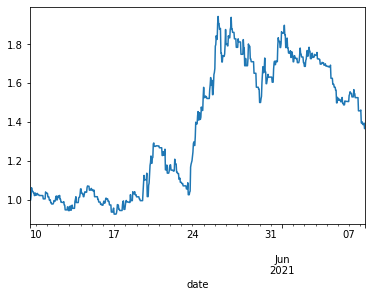

In [158]:
(1 + model_df['Strategy Returns']).cumprod().plot()


NameError: name 'X' is not defined

In [160]:
# Assign a copy of the input features to a features DataFrame called X
X = model_df[x_input_list].shift().dropna()

# Review the DataFrame
len(X)

# Construct training start and end dates
training_start = X.index.min().strftime(format= '%Y-%m-%d, %H:%M:%S')
training_end = '2021-05-30, 09:00:00'

# Construct testing start and end dates
testing_start =  '2021-05-30, 10:00:00'
testing_end = X.index.max().strftime(format= '%Y-%m-%d, %H:%M:%S')

# Print training and testing start/end dates
print(f"Training Start: {training_start}")
print(f"Training End: {training_end}")
print(f"Testing Start: {testing_start}")
print(f"Testing End: {testing_end}")

Training Start: 2021-05-09, 13:00:00
Training End: 2021-05-30, 09:00:00
Testing Start: 2021-05-30, 10:00:00
Testing End: 2021-06-08, 10:00:00


In [161]:
y = model_df['positive_return'].dropna()
y.value_counts()

1    365
0    354
Name: positive_return, dtype: int64

In [162]:
len(y)

719

In [164]:
# Construct the x train and y train datasets
X_train = X[training_start:training_end]
y_train = y[training_start:training_end]

X_train.head()

,daily_return,volume,EMA_9,EMA_20,EMA_50,EMA_200,mac_fast_12,mac_slow_26,rsi_oversold,rsi_overbought
date,,,,,,,,,,
2021-05-09 13:00:00,-0.021105,1777.427578,47.697080,47.697080,47.697080,47.697080,47.697080,47.697080,0.0,0.0
2021-05-09 14:00:00,0.023348,834.732460,48.275332,48.263548,48.257760,48.254865,47.868409,47.779572,0.0,0.0
2021-05-09 15:00:00,0.022596,1307.732680,48.863994,48.832751,48.817392,48.809711,48.183062,47.937652,0.0,0.0
2021-05-09 16:00:00,0.037823,2582.096918,49.685262,49.613961,49.579008,49.561556,48.739748,48.223864,0.0,0.0
2021-05-09 17:00:00,-0.017429,4851.980910,49.966690,49.889018,49.850313,49.830839,49.071893,48.421999,0.0,0.0


In [165]:
y_train.head()

date
2021-05-09 13:00:00    1
2021-05-09 14:00:00    1
2021-05-09 15:00:00    1
2021-05-09 16:00:00    0
2021-05-09 17:00:00    0
Name: positive_return, dtype: int32

In [167]:
# Construct the x test and y test datasets
X_test = X[testing_start:testing_end]
y_test = y[testing_start:testing_end]

X_test.tail()

,daily_return,volume,EMA_9,EMA_20,EMA_50,EMA_200,mac_fast_12,mac_slow_26,rsi_oversold,rsi_overbought
date,,,,,,,,,,
2021-06-08 06:00:00,-0.009710,3630.596784,25.903875,26.897996,28.022754,30.046627,24.870414,25.904801,1.0,0.0
2021-06-08 07:00:00,-0.010605,1237.084898,25.727665,26.783156,27.960852,30.022003,24.663685,25.728644,1.0,0.0
2021-06-08 08:00:00,0.023567,3226.119101,25.605616,26.691116,27.907437,29.999574,24.574063,25.606606,0.0,0.0
2021-06-08 09:00:00,0.005115,1343.862639,25.501743,26.606406,27.856452,29.977701,24.517178,25.502733,0.0,0.0
2021-06-08 10:00:00,-0.020224,928.390683,25.369287,26.507908,27.799430,29.954071,24.393737,25.370294,0.0,0.0


In [168]:
y_test.tail()

date
2021-06-08 06:00:00    0
2021-06-08 07:00:00    1
2021-06-08 08:00:00    1
2021-06-08 09:00:00    0
2021-06-08 10:00:00    1
Name: positive_return, dtype: int32

In [169]:
# Scale the features DataFrames

# Create a StandardScaler instance
scaler = StandardScaler()

# Apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)

# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)


In [ ]:
display(len(X_train_scaled))
display(len(y_train))
display(len(X_test_scaled))
display(len(y_test))


505

505

213

213

## Random forest

In [170]:
model = RandomForestClassifier(n_estimators=100, max_depth=3, random_state=0)
model.fit(X_train_scaled, y_train)

# Make a prediction of "y" values from the x test dataset
predictions = model.predict(X_test_scaled)

# Assemble actual y data (Y_test) with predicted y data (from just above) into two columns in a dataframe:
Results = y_test.to_frame()
Results["Predicted Value"] = predictions
Results

,positive_return,Predicted Value
date,,
2021-05-30 10:00:00,1,1
2021-05-30 11:00:00,1,1
2021-05-30 12:00:00,0,1
2021-05-30 13:00:00,1,1
2021-05-30 14:00:00,0,1
...,...,...
2021-06-08 06:00:00,0,1
2021-06-08 07:00:00,1,1
2021-06-08 08:00:00,1,1


In [171]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.49      0.71      0.58       107
           1       0.50      0.28      0.36       110

    accuracy                           0.49       217
   macro avg       0.50      0.50      0.47       217
weighted avg       0.50      0.49      0.47       217



In [172]:
# Create a new empty predictions DataFrame.

# Create a predictions DataFrame
#predictions_df = pd.DataFrame(index=X_test.index)

# Add the RF model predictions to the DataFrame
#predictions_df['Predicted'] = svm_pred

# Add the daily_return to the DataFrame
Results['daily_return'] = model_df['daily_return']

# Add the strategy returns to the DataFrame
Results['Strategy Returns'] = (
    Results['daily_return'] * Results['Predicted Value']
)

# Review the DataFrame
display(Results.head())
display(Results.tail())

,positive_return,Predicted Value,daily_return,Strategy Returns
date,,,,
2021-05-30 10:00:00,1,1,0.015279,0.015279
2021-05-30 11:00:00,1,1,0.029479,0.029479
2021-05-30 12:00:00,0,1,-0.041299,-0.041299
2021-05-30 13:00:00,1,1,0.001387,0.001387
2021-05-30 14:00:00,0,1,-0.036436,-0.036436


,positive_return,Predicted Value,daily_return,Strategy Returns
date,,,,
2021-06-08 06:00:00,0,1,-0.010605,-0.010605
2021-06-08 07:00:00,1,1,0.023567,0.023567
2021-06-08 08:00:00,1,1,0.005115,0.005115
2021-06-08 09:00:00,0,1,-0.020224,-0.020224
2021-06-08 10:00:00,1,1,0.010523,0.010523


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
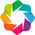

:NdOverlay   [Variable]
   :Curve   [date]   (value)

In [173]:
import holoviews as hv
hv.extension('bokeh')
# Plot the actual returns versus the strategy returns
(1 + Results[['daily_return', 'Strategy Returns']]).cumprod().hvplot()

##Try Support Vector Machine

In [174]:
from sklearn import svm
# From SVM, instantiate SVC classifier model instance
svm_model = svm.SVC()
 
# Fit the model to the data using the training data
svm_model = svm_model.fit(X_train_scaled, y_train)
 
# Use the testing data to make the model predictions
svm_pred = svm_model.predict(X_test_scaled)

# Review the model's predicted values
svm_pred

array([1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [175]:
# Use a classification report to evaluate the model using the predictions and testing data
svm_testing_report = classification_report(y_test, svm_pred)

# Print the classification report
print(svm_testing_report)

              precision    recall  f1-score   support

           0       0.52      0.83      0.64       107
           1       0.61      0.25      0.36       110

    accuracy                           0.54       217
   macro avg       0.56      0.54      0.50       217
weighted avg       0.57      0.54      0.50       217



In [176]:
# Create a new empty predictions DataFrame.

# Create a predictions DataFrame
predictions_df = pd.DataFrame(index=X_test.index)

# Add the SVM model predictions to the DataFrame
predictions_df['Predicted'] = svm_pred

# Add the daily_return to the DataFrame
predictions_df['daily_return'] = model_df['daily_return']

# Add the strategy returns to the DataFrame
predictions_df['Strategy Returns'] = (
    predictions_df['daily_return'] * predictions_df['Predicted']
)

# Review the DataFrame
display(predictions_df.head())
display(predictions_df.tail())

,Predicted,daily_return,Strategy Returns
date,,,
2021-05-30 10:00:00,1,0.015279,0.015279
2021-05-30 11:00:00,1,0.029479,0.029479
2021-05-30 12:00:00,1,-0.041299,-0.041299
2021-05-30 13:00:00,1,0.001387,0.001387
2021-05-30 14:00:00,0,-0.036436,-0.000000


,Predicted,daily_return,Strategy Returns
date,,,
2021-06-08 06:00:00,1,-0.010605,-0.010605
2021-06-08 07:00:00,1,0.023567,0.023567
2021-06-08 08:00:00,1,0.005115,0.005115
2021-06-08 09:00:00,1,-0.020224,-0.020224
2021-06-08 10:00:00,1,0.010523,0.010523


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
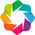

:NdOverlay   [Variable]
   :Curve   [date]   (value)

In [ ]:
import holoviews as hv
hv.extension('bokeh')
# Plot the actual returns versus the strategy returns
(1 + predictions_df[['daily_return', 'Strategy Returns']]).cumprod().hvplot()